# HS-release: Different methods to find the ball release frame index

In [1]:
import cv2
import numpy as np
import matplotlib
import matplotlib.pylab as plt
import json
from scipy.signal import argrelextrema
from scipy import ndimage
import ast
import pandas as pd
import os

## Set path to videos - date can be changed for other ATL videos

In [2]:
path = os.path.join("..", "train_data", "ATL", "2017-06-07", "center field")

## Get data: Joint trajectories from csv file

In [3]:
cf = pd.read_csv(os.path.join("..", "train_data", "cf_pitcher.csv"))
print("Loaded csv file with joint trajectories")
print("number of different games", len(np.unique(cf["Game"].values)), "length of csv file", len(cf.index))

i=0
game_id = os.listdir(path)[i][:6]
while game_id[0]==".":
    i+=1
    game_id = os.listdir(path)[i][:6]
print("Game id:", game_id)

min_length = 160
label = "pitch_frame_index"
joints_array = []
release = []
files_csv = []
hands = []
# find the games of the specified folder in the csv file, and get joint trajectories and metadata
for i in cf.index:
    if cf.loc[i]["Game"][:6]!=game_id:
        continue
    d = np.array(eval(cf.loc[i]["Data"]))
    if len(d)<min_length or pd.isnull(cf.loc[i][label]):
        continue
    joints_array.append(d[:min_length]) # joint trajectories (cut to 160 frames)
    release.append(cf.loc[i][label]) # ball release frame (ground truth label)
    files_csv.append(cf.loc[i]["Game"]) # file name
    hands.append(cf.loc[i]["handedness"]) # handedness of the pitcher

joints_array = np.array(joints_array)
release = np.array(release)
unique = np.unique(release)
print("Successfully loaded data. Shape of joint trajectories array:", joints_array.shape, ", Shape of release labels", release.shape, ", occuring release frames:", unique)

number of different games 8353 length of csv file 8353


FileNotFoundError: [Errno 2] No such file or directory: '../train_data/ATL/2017-06-07/center field'

## Run method on files:

### Find the ball release frame by finding the moment the arm is highest above the shoulders

490987-01c04433-b8f6-4a3e-b27d-d934b1b922a1
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  92


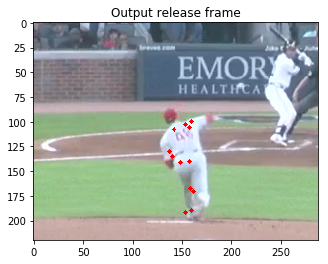

490987-02b98e0c-1a9b-4aa4-8d81-30f9eb7f28c4
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  97


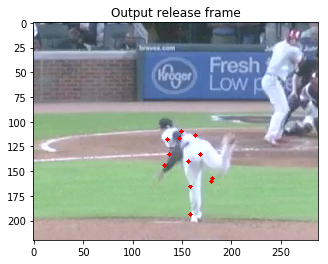

490987-076471c4-0f0d-4a0e-80f1-79e754d99a9c
Statcast label for release frame: 92.0
Pitcher handedness:  R
Output HS release:  92


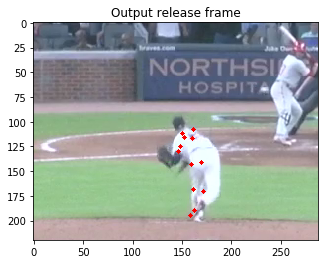

490987-07cc8175-e423-46b3-9a77-aa272dff9cf6
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  94


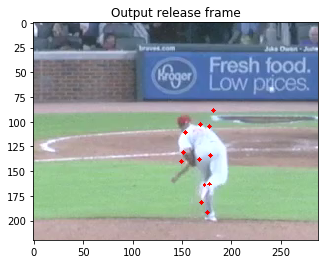

490987-08c18569-b30e-4bca-8f06-0d23fa71cc00
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  92


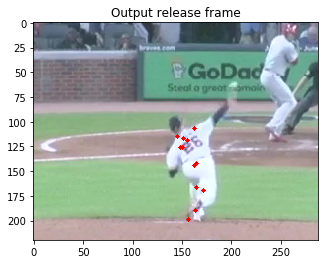

490987-090ed048-bc64-4ff1-8fb8-ab60daa4ad19
Statcast label for release frame: 93.0
Pitcher handedness:  L
Output HS release:  92


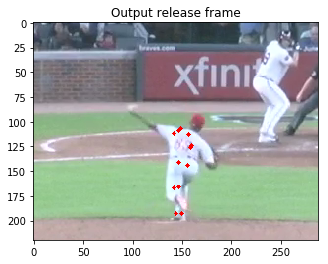

490987-09367424-e3d8-431c-8b37-cb59b035f29b
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  93


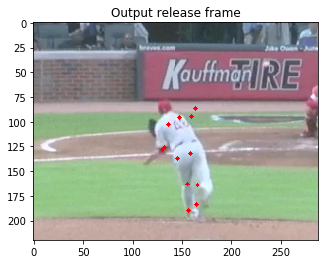

490987-0c487238-52e2-4bc0-9d0d-9da72b0d7953
Statcast label for release frame: 95.0
Pitcher handedness:  R
Output HS release:  152


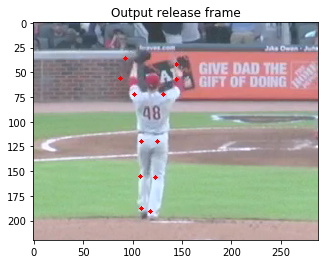

490987-0eccdacd-c37c-4f28-8e04-25134da92bb8
Statcast label for release frame: 95.0
Pitcher handedness:  R
Output HS release:  154


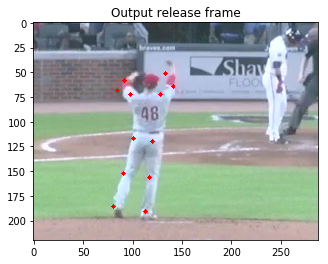

490987-0f053438-e887-4151-b80c-b191f3bfa236
Statcast label for release frame: 92.0
Pitcher handedness:  L
Output HS release:  91


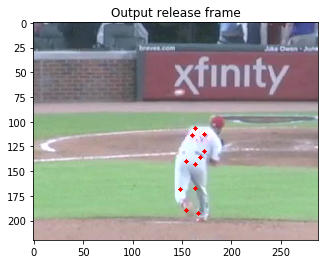

490987-1447164e-216f-4134-82c3-2f98eeca833c
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  93


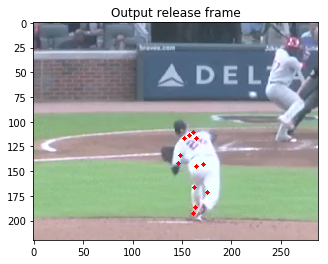

490987-181e2354-127d-4dab-96f5-bcfe17937913
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  96


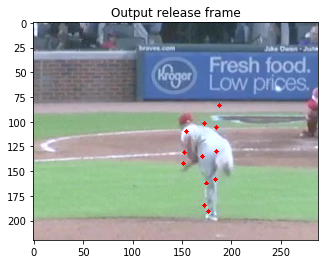

490987-1c6b9d58-e497-45b7-a0ba-21b1aaa7ba03
Statcast label for release frame: 91.0
Pitcher handedness:  L
Output HS release:  89


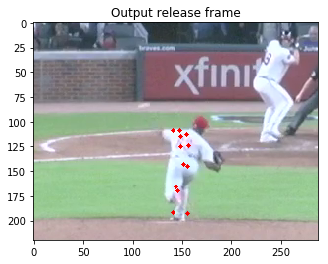

490987-1fc9757f-bf55-4e46-85ab-33466bf4ea84
Statcast label for release frame: 92.0
Pitcher handedness:  R
Output HS release:  92


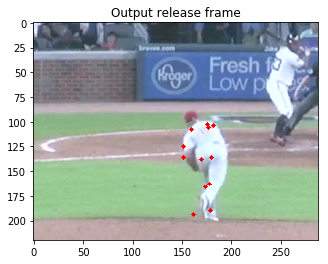

490987-201c3905-7415-4359-b9b0-507be7469687
Statcast label for release frame: 91.0
Pitcher handedness:  R
Output HS release:  91


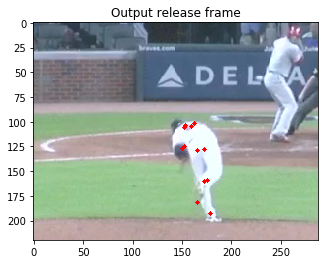

490987-2079eb55-b9a2-4b61-aedb-476e8a718991
Statcast label for release frame: 92.0
Pitcher handedness:  R
Output HS release:  92


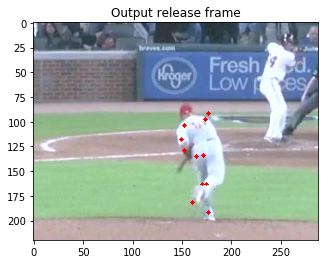

490987-24bd0c5b-707f-4ecc-8982-6342aced0356
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  92


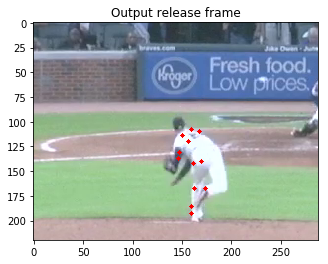

490987-24fdf1cc-0c26-4a3f-82c6-031a2dcfaad3
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  113


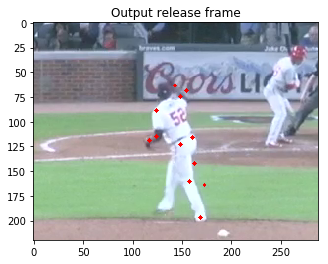

490987-2b8452c8-c23e-4e1f-9f5e-475d7b9d5bb9
Statcast label for release frame: 96.0
Pitcher handedness:  R
Output HS release:  95


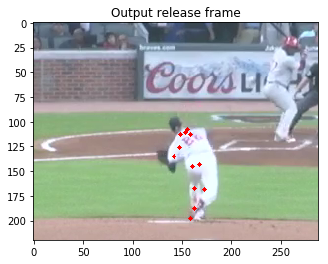

490987-2ec7a27b-68af-44d2-9752-7ce29d6ff15c
Statcast label for release frame: 94.0
Pitcher handedness:  L
Output HS release:  93


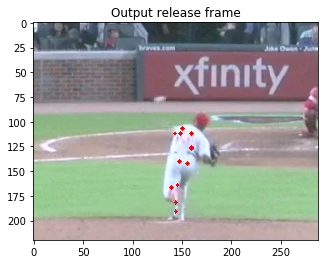

490987-313083db-da18-4d11-9517-6187ec3a3c84
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  94


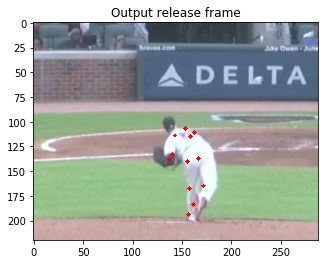

490987-33089b0a-4687-457e-aaa5-d49e55c06b8e
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  92


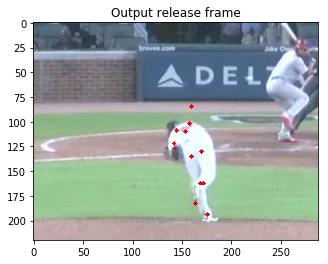

490987-338182b6-1185-4d39-93f2-0f8f7b6d1a67
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  91


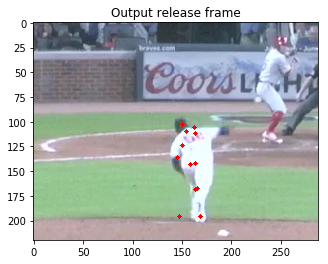

490987-3413b269-9789-4a9a-8488-ede0fa550ffb
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  93


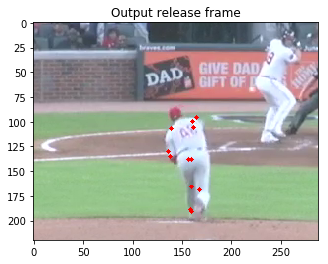

490987-34f6ed15-64a8-4dc9-a499-612bd9dfdb0f
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  94


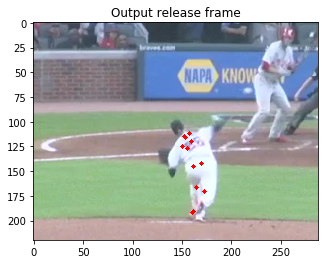

490987-39cf116f-a4a6-442f-aaec-5accaf3b4079
Statcast label for release frame: 92.0
Pitcher handedness:  R
Output HS release:  92


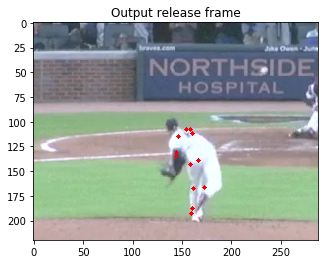

490987-3ed9d980-9478-4295-9342-065b0d2db7c6
Statcast label for release frame: 96.0
Pitcher handedness:  R
Output HS release:  95


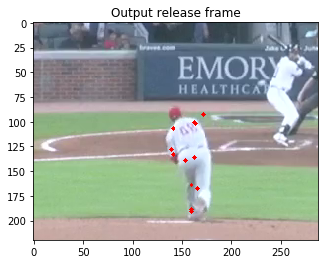

490987-40615eb3-6c74-4265-a28f-4f9d73c39c86
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  97


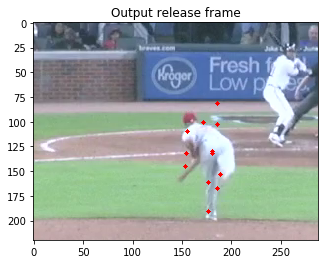

490987-44690964-c46c-46ea-a937-305de56a9b69
Statcast label for release frame: 93.0
Pitcher handedness:  L
Output HS release:  92


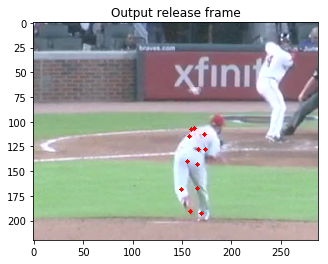

490987-45591c3c-30c1-4921-a258-bfb8d2afc474
Statcast label for release frame: 93.0
Pitcher handedness:  L
Output HS release:  91


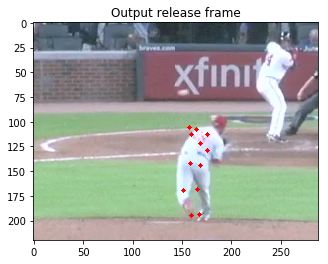

490987-4979886b-69a8-4b21-88cd-eb98c1893e44
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  95


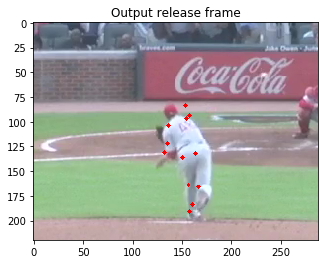

490987-49b51b3c-5260-4d06-b44d-0553adea105d
Statcast label for release frame: 95.0
Pitcher handedness:  R
Output HS release:  94


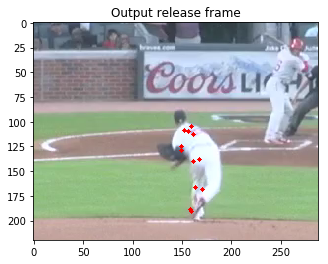

490987-50bc406c-d234-47ee-8181-f30516f6a73c
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  94


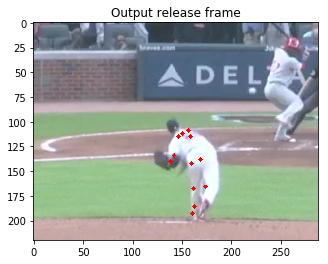

490987-5326c817-b001-46fd-9529-5eced5430e64
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  91


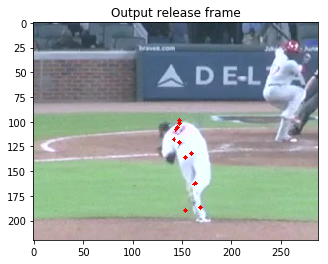

490987-5531fb5f-353b-4065-96be-4e02696c8d0e
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  131


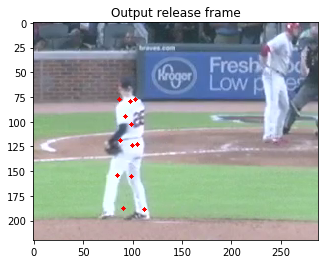

490987-557d90d1-6e93-424c-b596-606110b3e41d
Statcast label for release frame: 95.0
Pitcher handedness:  R
Output HS release:  95


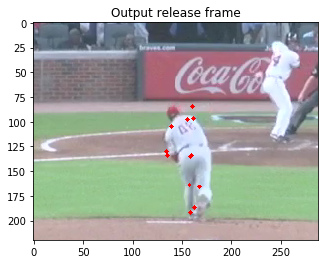

490987-55b605df-04c4-458f-9eaa-76634ea17b3e
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  93


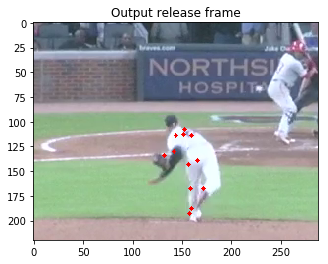

490987-577af345-1647-4960-944d-cd6beed1c955
Statcast label for release frame: 94.0
Pitcher handedness:  L
Output HS release:  93


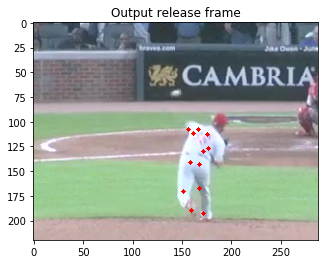

490987-57c3f683-d3cb-4f01-8fb6-09239834caf7
Statcast label for release frame: 92.0
Pitcher handedness:  R
Output HS release:  94


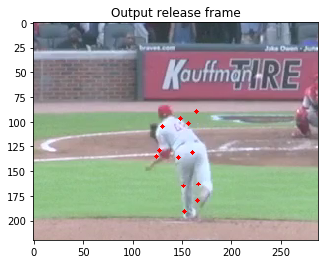

490987-582b185a-673d-454f-be24-42c45a5bfbd6
Statcast label for release frame: 93.0
Pitcher handedness:  L
Output HS release:  91


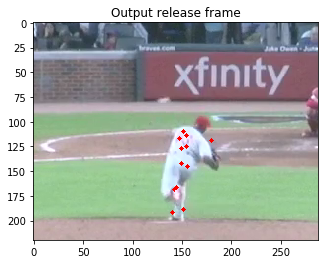

490987-5ad4a04a-8ff5-4227-ba9e-707a3ad83ecb
Statcast label for release frame: 92.0
Pitcher handedness:  R
Output HS release:  94


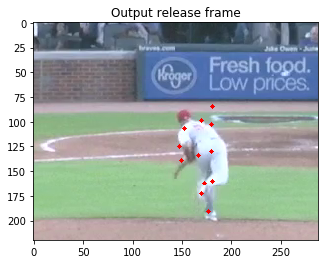

490987-5b2ea358-9a24-4421-aea9-8b187eed41b3
Statcast label for release frame: 93.0
Pitcher handedness:  L
Output HS release:  93


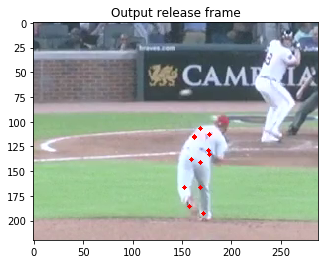

490987-5f729d8e-6f23-4de2-af80-5064382f76b1
Statcast label for release frame: 94.0
Pitcher handedness:  L
Output HS release:  115


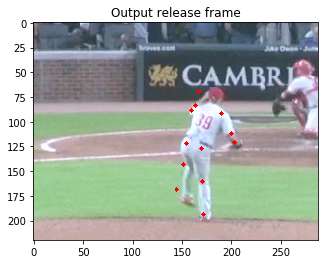

490987-6833b0b2-bc96-4bb0-85c7-cd7ca01d949f
Statcast label for release frame: 92.0
Pitcher handedness:  L
Output HS release:  92


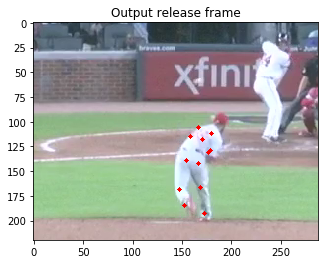

490987-689f2927-566f-433d-a1dc-ee52294b8772
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  93


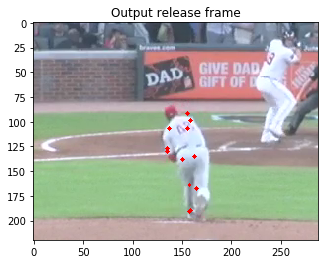

490987-68e4477a-dc52-436a-bd10-864bd2e0e9e7
Statcast label for release frame: 92.0
Pitcher handedness:  R
Output HS release:  93


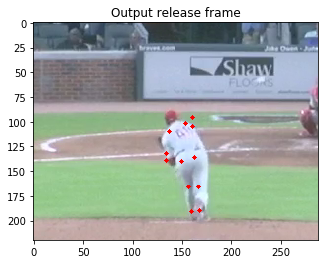

490987-69d047ec-4fbf-4c88-830a-86541b7a321c
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  92


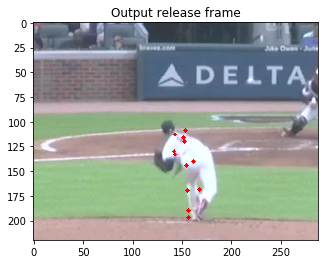

490987-6b4e0cc4-43d4-4b0e-9752-cca92b99a5d5
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  94


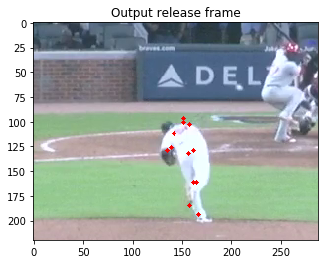

490987-6b7ffaf7-f411-431a-b657-f41a75252e16
Statcast label for release frame: 92.0
Pitcher handedness:  R
Output HS release:  97


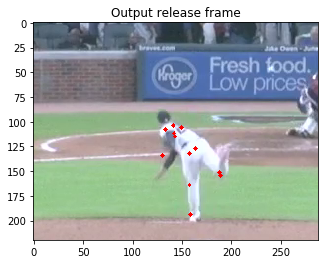

490987-6b94a727-755f-4f1c-8ce5-ba9e4487a353
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  94


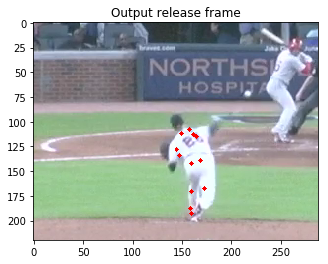

490987-6d986cd7-8c88-47a2-b7c1-befae7886bc5
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  94


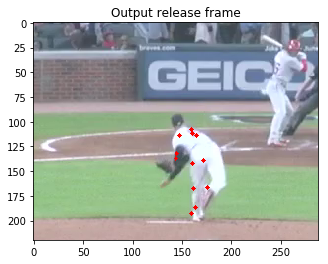

490987-6dfb8644-9e18-4f5a-9e85-347f7a725d78
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  93


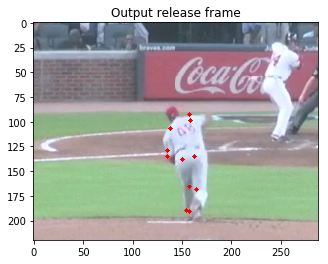

490987-6e095e22-78db-4fda-88e6-1e663d28760e
Statcast label for release frame: 91.0
Pitcher handedness:  R
Output HS release:  94


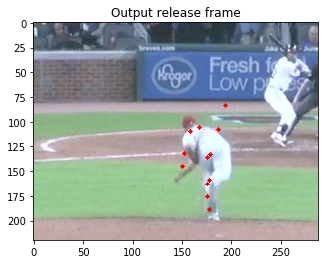

490987-72195c76-5c01-4e4a-9c7d-9872cd0dc10c
Statcast label for release frame: 92.0
Pitcher handedness:  R
Output HS release:  92


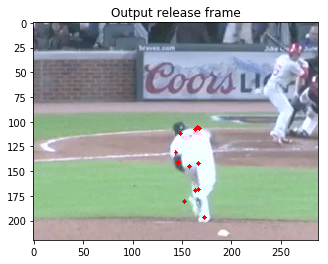

490987-73c9b1f6-09c6-48e7-9775-91fe63a8a145
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  94


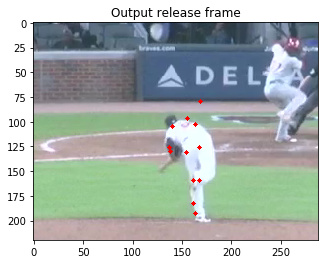

490987-73f15cd6-5e98-4797-a3a0-1076be0b08bf
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  92


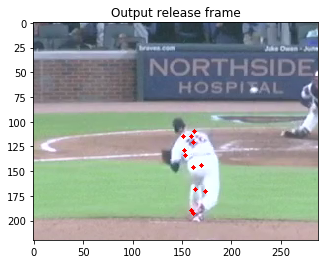

490987-766c32df-a0d2-4e02-803e-9482c2acb843
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  93


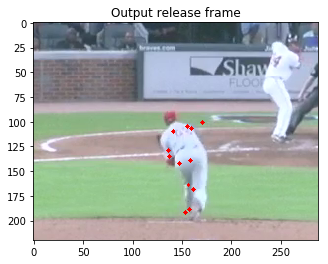

490987-77fcb36f-eb9a-4901-82eb-2452161f2b2d
Statcast label for release frame: 92.0
Pitcher handedness:  L
Output HS release:  90


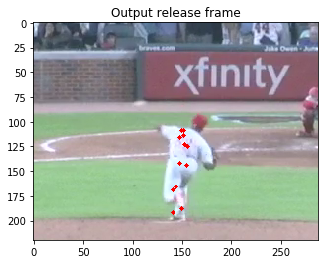

490987-791fe22b-835e-427f-b6a2-c83892f9c415
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  94


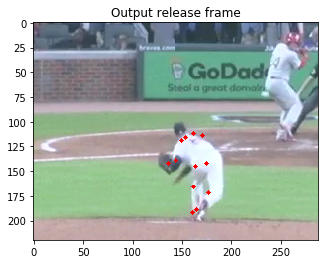

490987-79a32c9c-d4dc-4a63-aae9-804f697eb56d
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  159


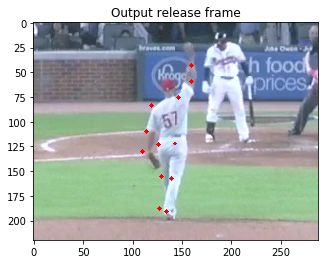

490987-7e63f8d1-22fe-415c-a794-aa8048f0c970
Statcast label for release frame: 94.0
Pitcher handedness:  L
Output HS release:  93


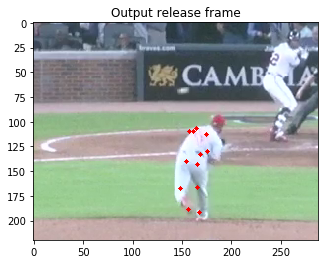

490987-7edca537-27b3-4957-a471-462db946a96a
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  95


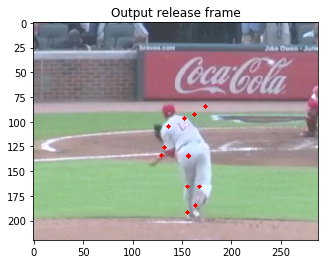

490987-7f328c1a-777a-490b-bb7e-142592fcbfa5
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  93


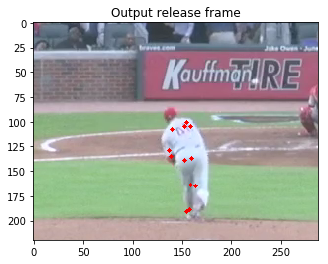

490987-7f4631c5-f688-4988-bd0e-ea7623a4787c
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  92


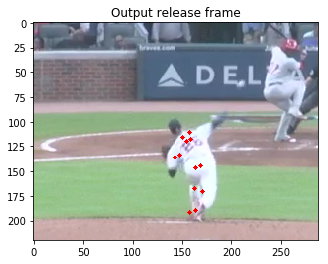

490987-812f6fc0-2e99-4c44-92fc-db359ac536b5
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  93


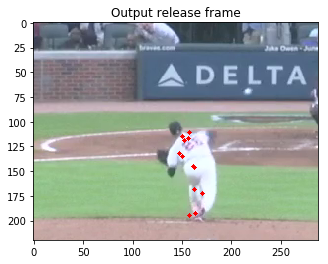

490987-828e62fa-2029-4f64-94b8-e1dc170eec22
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  94


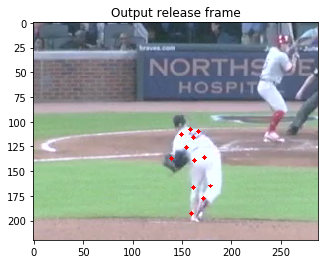

490987-836e4799-78f1-4ff3-8618-ffc5daf4d542
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  94


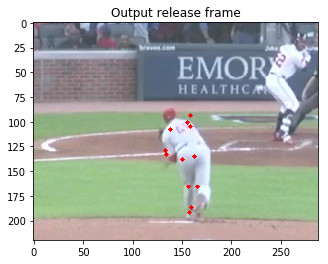

490987-8574b841-5bf6-4b31-9ec1-08ed29a14247
Statcast label for release frame: 92.0
Pitcher handedness:  R
Output HS release:  112


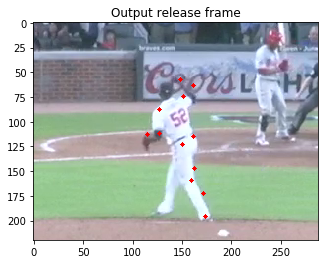

490987-879f4a2a-74ee-4bf4-bd37-5ef7b0d7ed9a
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  94


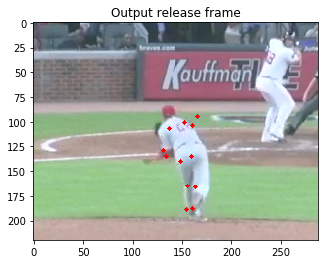

490987-8ebdc0ca-65e8-4127-aabf-6171612af5bc
Statcast label for release frame: 91.0
Pitcher handedness:  L
Output HS release:  91


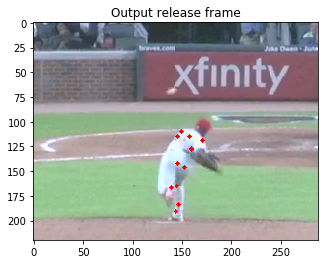

490987-8f262902-e44f-4141-938f-1405c52de552
Statcast label for release frame: 95.0
Pitcher handedness:  R
Output HS release:  95


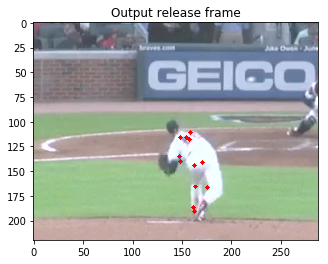

490987-8fb7f74a-5e03-46e4-ae70-51c6fd7bf2c4
Statcast label for release frame: 93.0
Pitcher handedness:  L
Output HS release:  93


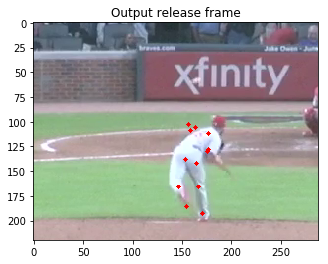

490987-90dfcce3-20e8-445b-a4e1-182731875ce3
Statcast label for release frame: 91.0
Pitcher handedness:  R
Output HS release:  94


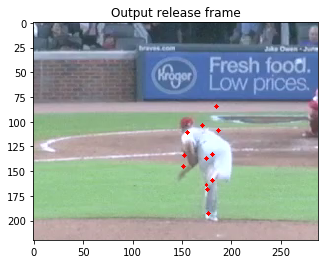

490987-94b97f85-9bb5-43e7-82af-1aeada06c449
Statcast label for release frame: 95.0
Pitcher handedness:  R
Output HS release:  94


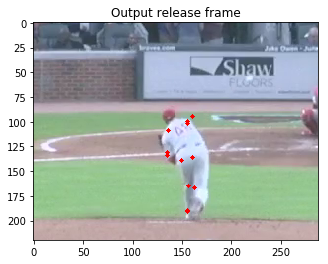

490987-95bdbdc2-454f-4dcb-a21c-afc087d35e27
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  94


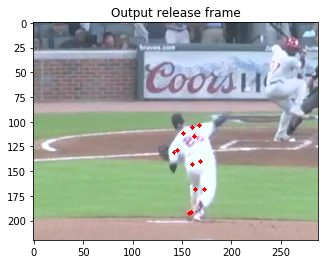

490987-95c9d8c5-c0db-4e2d-a9a4-3be9371ae09c
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  94


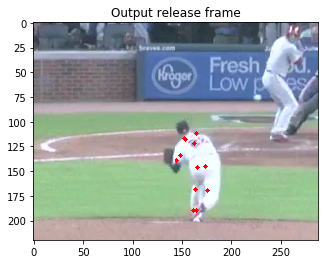

490987-96ce954d-3e6e-4719-8d35-325911629d01
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  92


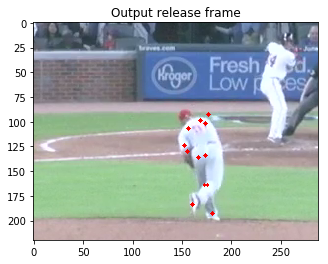

490987-99559765-f81e-4bdd-83b3-9e4f9a228d8a
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  147


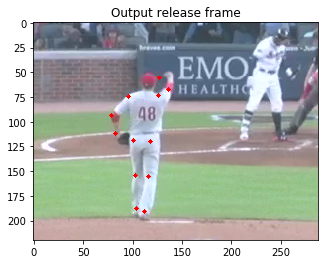

490987-9e4e1c0c-94b8-43b4-8daf-3eb70c66c602
Statcast label for release frame: 96.0
Pitcher handedness:  R
Output HS release:  95


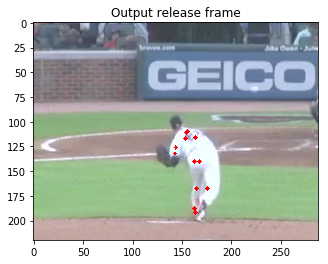

490987-9f377a73-7711-4882-b212-247b11d21f3b
Statcast label for release frame: 93.0
Pitcher handedness:  L
Output HS release:  93


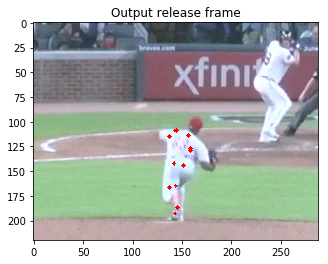

490987-a1e2128c-e186-4c55-91a3-642777e8a5fb
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  92


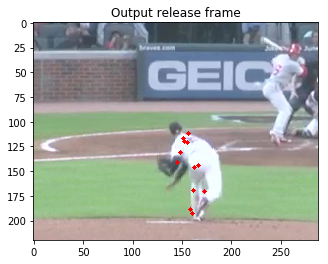

490987-a21ebfa1-b31c-4d78-bdb1-c71f728bb72d
Statcast label for release frame: 93.0
Pitcher handedness:  L
Output HS release:  92


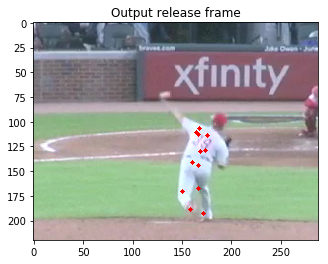

490987-a2d02351-4fb5-4079-b4a5-a74da386cc69
Statcast label for release frame: 95.0
Pitcher handedness:  R
Output HS release:  96


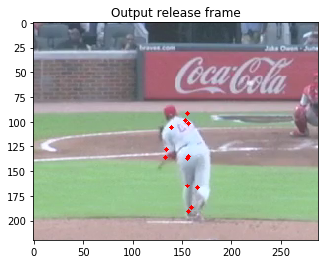

490987-a301cabf-83ff-4ffb-9f2f-4b167f0cd8d5
Statcast label for release frame: 93.0
Pitcher handedness:  L
Output HS release:  91


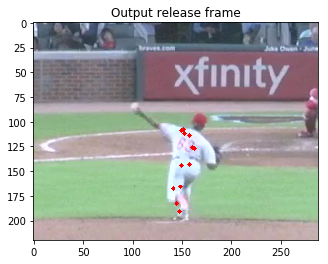

490987-a30aedaa-0fb5-4ea1-a815-8d524caae21a
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  94


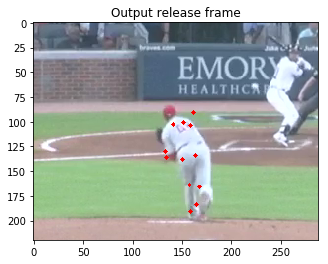

490987-a5f950be-2ce6-4e79-bf72-950b125eb9b8
Statcast label for release frame: 95.0
Pitcher handedness:  R
Output HS release:  95


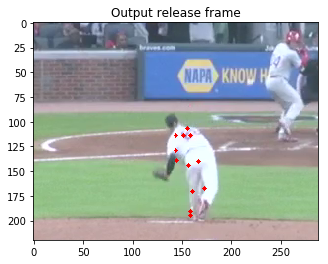

490987-a68aaaa6-a8c0-4c08-b99c-3f77ea0f01f7
Statcast label for release frame: 93.0
Pitcher handedness:  L
Output HS release:  92


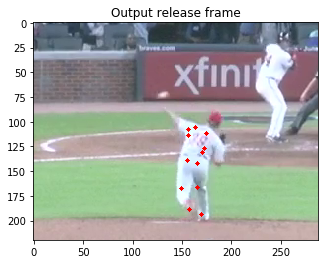

490987-a8b81389-110d-4e8f-a018-199a7d7ef583
Statcast label for release frame: 92.0
Pitcher handedness:  L
Output HS release:  91


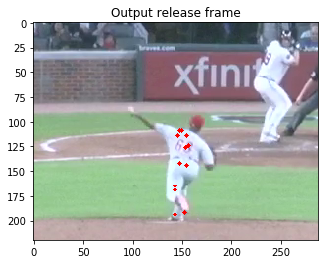

490987-a939556f-c0ce-4ab7-853d-956b30da9151
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  113


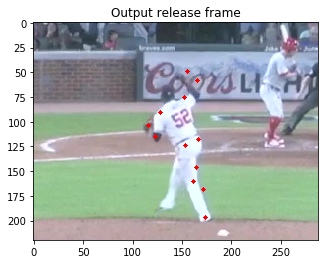

490987-a9af8ca6-7cc5-4cf8-a571-673be524e9a7
Statcast label for release frame: 91.0
Pitcher handedness:  R
Output HS release:  90


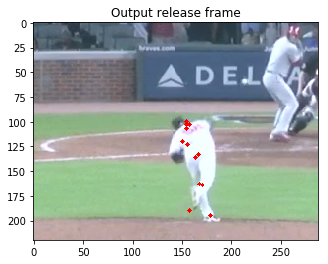

490987-ad8a5f4f-ee2f-4998-ab1e-0f5f5de4571d
Statcast label for release frame: 94.0
Pitcher handedness:  L
Output HS release:  92


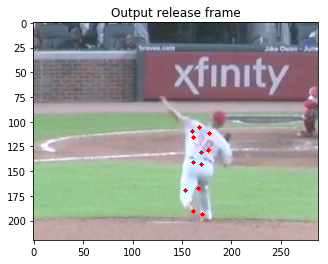

490987-af62fe6d-a2ad-4b66-8e27-42fc5403469f
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  94


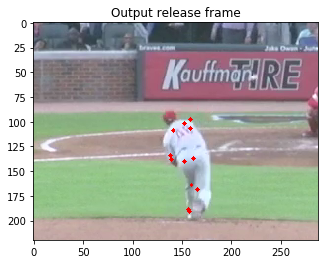

490987-b046b011-db3a-43c1-b313-0be252861ead
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  93


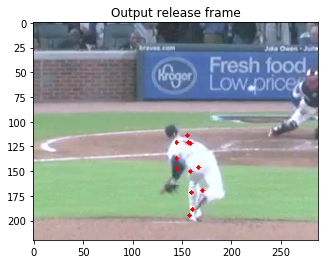

490987-b2dc9885-0cc0-4ff0-be59-cee5c69010c4
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  94


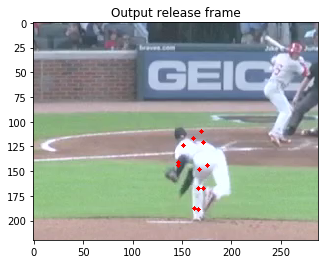

490987-b6b51c40-97fb-4bc4-8f82-1566df26b558
Statcast label for release frame: 95.0
Pitcher handedness:  R
Output HS release:  94


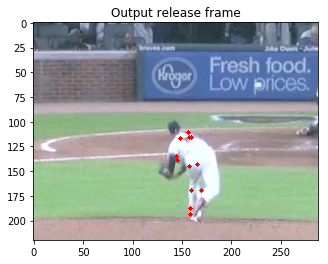

490987-b6f39d56-9ce5-46fa-b89e-ed2534de3b1d
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  94


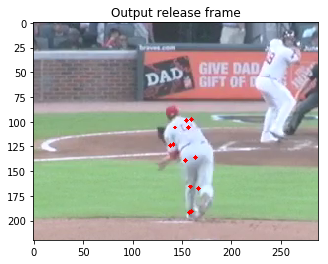

490987-b73fc5e5-e342-4472-b1cc-7f00a3b42426
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  94


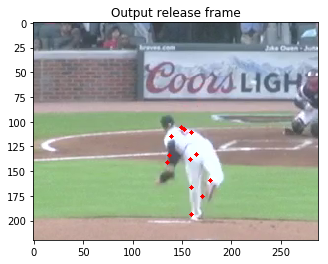

490987-ba579212-9582-4e81-9394-adadd2481f03
Statcast label for release frame: 92.0
Pitcher handedness:  L
Output HS release:  91


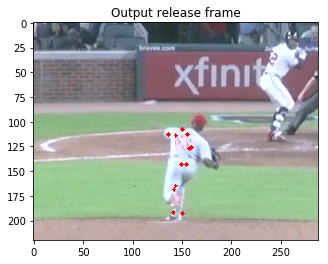

490987-bae1dcaa-b7b8-462c-b54f-fd4763afe798
Statcast label for release frame: 93.0
Pitcher handedness:  L
Output HS release:  114


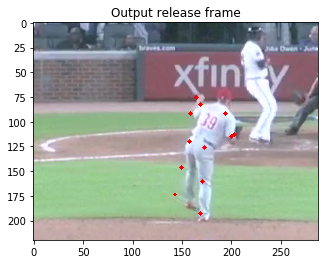

490987-be17654c-af88-4254-90f5-f9ad9ca8aa5a
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  93


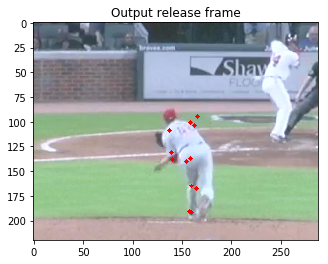

490987-bf4f3bcb-90ed-4f40-8639-d8af827e8707
Statcast label for release frame: 95.0
Pitcher handedness:  R
Output HS release:  66


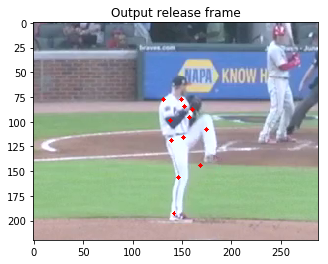

490987-c0063b86-7a43-4b8c-a603-c7d3fb52b02a
Statcast label for release frame: 95.0
Pitcher handedness:  R
Output HS release:  95


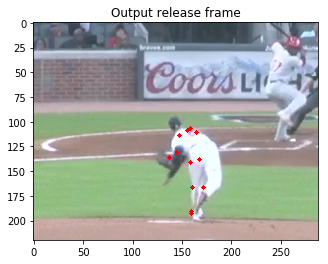

490987-c016d0e9-9c5c-453a-b897-4e6ba28b9c13
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  93


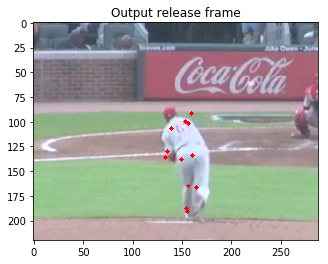

490987-c7f4c2d8-9a59-4b2e-b2ef-d259809f0d57
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  93


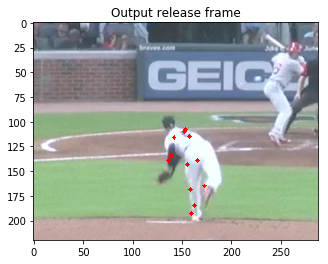

490987-c94cc38d-d7b4-4693-ba21-1059199ea88d
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  90


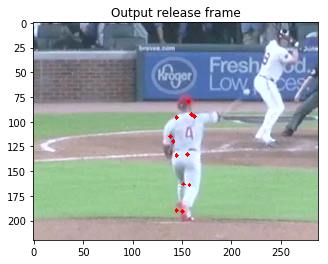

490987-c9f983ce-0d82-4f78-8fbc-db45e81f11c8
Statcast label for release frame: 95.0
Pitcher handedness:  R
Output HS release:  94


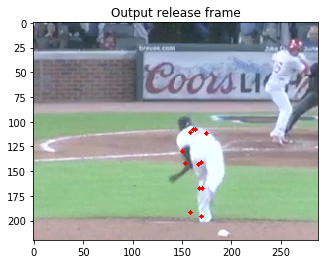

490987-cb34d919-bf0c-4cad-b9c9-11ed770093e8
Statcast label for release frame: 93.0
Pitcher handedness:  L
Output HS release:  108


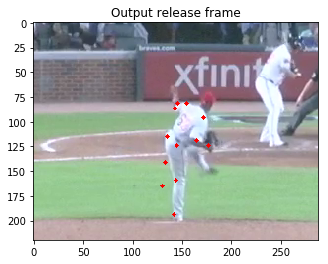

490987-cd6f81d0-2884-44af-8a5e-694c47a789c0
Statcast label for release frame: 93.0
Pitcher handedness:  L
Output HS release:  106


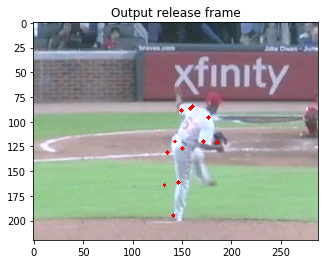

490987-cee0307f-dcbf-4256-b320-58bac36c691b
Statcast label for release frame: 95.0
Pitcher handedness:  R
Output HS release:  94


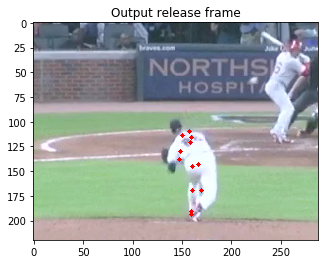

490987-d25a4f49-1142-4ada-9fbc-544886b97c99
Statcast label for release frame: 93.0
Pitcher handedness:  L
Output HS release:  93


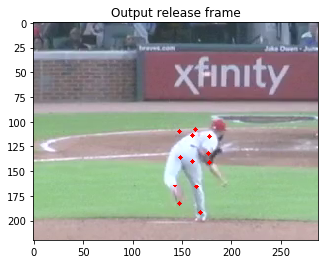

490987-d3973568-4809-47f7-9e76-5cb4967a3959
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  94


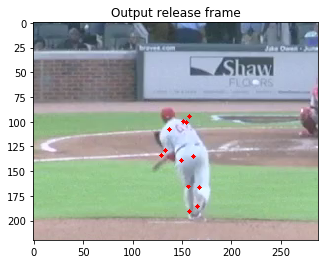

490987-d41c65ef-41ad-4288-8aca-b13e0f3db6f2
Statcast label for release frame: 96.0
Pitcher handedness:  R
Output HS release:  96


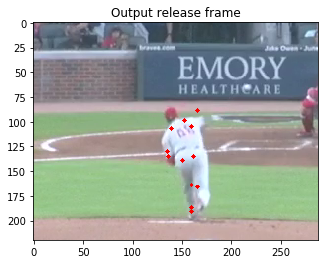

490987-d42897f9-615d-4df3-9948-39d5dab47e57
Statcast label for release frame: 92.0
Pitcher handedness:  R
Output HS release:  94


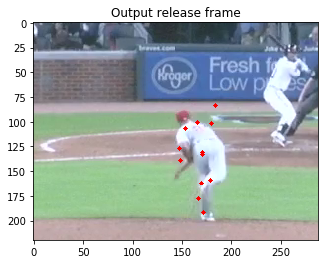

490987-d825e03f-98b4-4bd6-8043-8b5bfc52489b
Statcast label for release frame: 92.0
Pitcher handedness:  R
Output HS release:  92


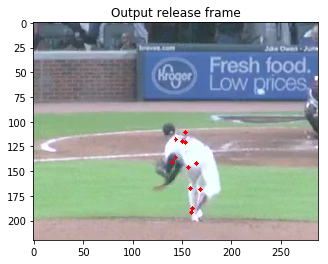

490987-d8e3cf16-5d09-40b8-86ae-df6910291471
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  99


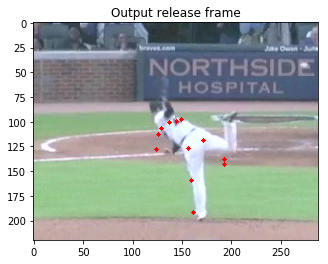

490987-ddfb4b93-75ea-4f26-ac7a-30669c061e1a
Statcast label for release frame: 95.0
Pitcher handedness:  R
Output HS release:  95


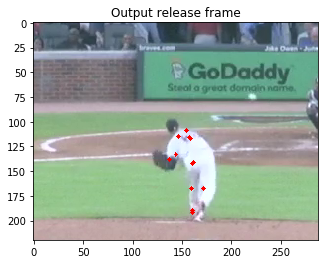

490987-dfc03752-5f8a-45a4-b904-c1ba1cf4823a
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  94


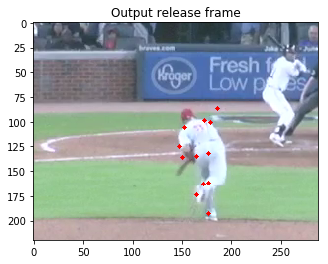

490987-e166e54d-e6dd-493e-8f68-469a4d701999
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  94


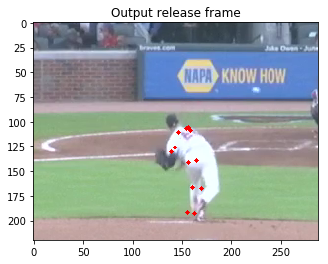

490987-e41efc0d-8871-4fab-960c-02233b31b8ed
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  95


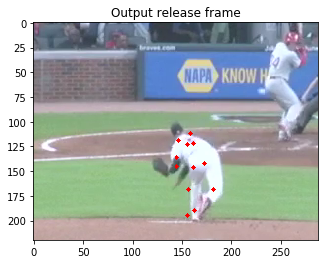

490987-e5225d18-6c47-41e2-b030-81c94a14716f
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  93


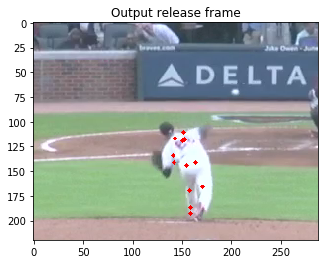

490987-e5815a99-9867-4348-9383-1f44ca6b56a6
Statcast label for release frame: 92.0
Pitcher handedness:  L
Output HS release:  106


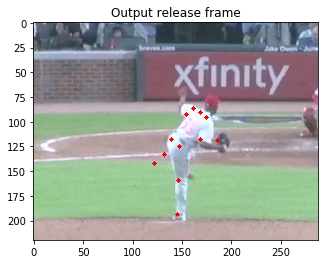

490987-e6666bc5-2967-4b39-9ea1-1eb831508877
Statcast label for release frame: 92.0
Pitcher handedness:  R
Output HS release:  94


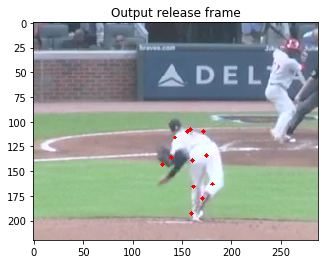

490987-e9945e91-66ad-48c7-9db0-4ff65b23b6d6
Statcast label for release frame: 92.0
Pitcher handedness:  R
Output HS release:  91


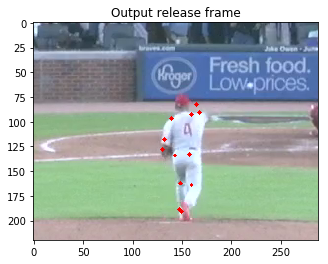

490987-eacdb8fa-67c1-47f7-864c-057c15989606
Statcast label for release frame: 92.0
Pitcher handedness:  R
Output HS release:  96


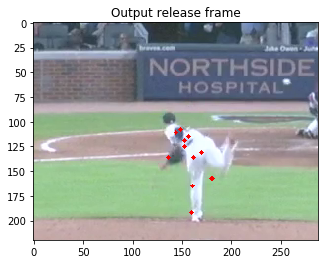

490987-ec136427-0068-4a23-b165-cfeae9bef727
Statcast label for release frame: 92.0
Pitcher handedness:  R
Output HS release:  91


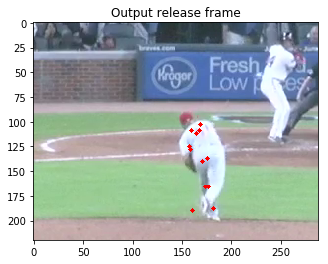

490987-ef23d536-2a3b-475c-98be-867adff43029
Statcast label for release frame: 92.0
Pitcher handedness:  R
Output HS release:  93


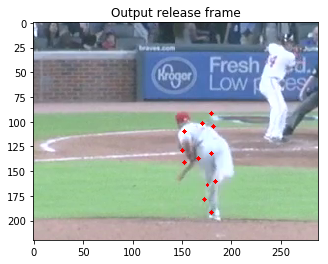

490987-f28861ea-2e04-4764-b851-ce9fd4caf400
Statcast label for release frame: 93.0
Pitcher handedness:  L
Output HS release:  91


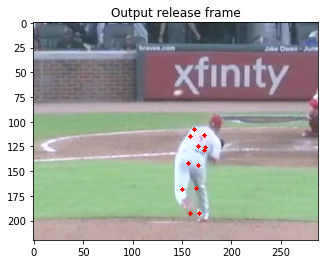

490987-f30d1d97-66b1-4c95-86ec-561aa504cacc
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  93


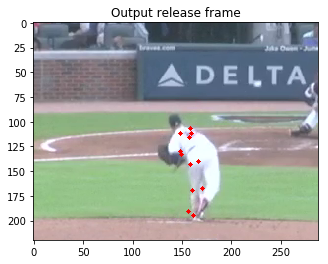

490987-f6f14813-28b2-4ae2-a5bc-fb242c681da9
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  94


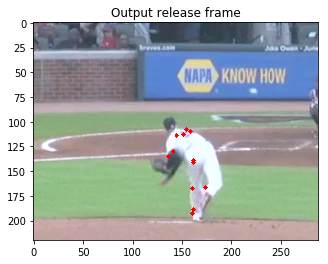

490987-f7247454-4c66-402e-9edb-f13d8630aa52
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  98


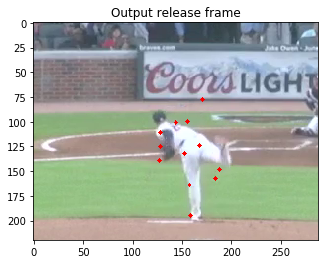

490987-fa522a12-2678-46ca-9c61-1c58dfd8cd29
Statcast label for release frame: 93.0
Pitcher handedness:  L
Output HS release:  92


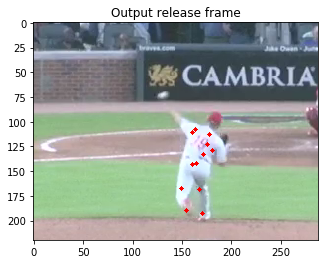

490987-fb916993-89e3-4802-8444-bf056fc36b62
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  92


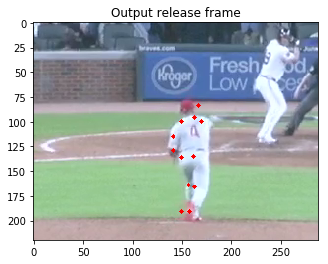

490987-fc2943ad-10e3-4074-8b25-120562eebffb
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  94


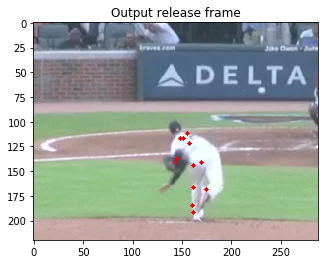

490987-fd30ce08-4c8c-4c73-ae20-568ccf89884e
Statcast label for release frame: 94.0
Pitcher handedness:  R
Output HS release:  159


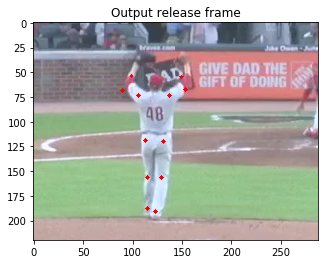

490987-fd6e0b0b-26f1-4fcb-ae6d-5aa69f0767bc
Statcast label for release frame: 93.0
Pitcher handedness:  R
Output HS release:  92


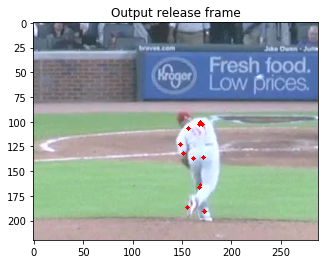

490987-ff856a4b-79c0-4b37-93ca-7165cd485c76
Statcast label for release frame: 95.0
Pitcher handedness:  R
Output HS release:  95


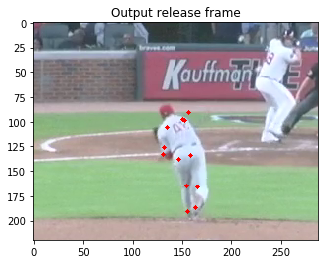

In [10]:
def hs_release(joints_array, handedness=None):
    """
    finds the ball release frame by searching for the point where the arm is raised highest above the shoulders
    joints_array: the set of trajectories of the pitcher (shape: #frames x #joints x 2)
    handedness: if the handedness is known, it can be taken into account. Otherwise simply the higher point is selected
    """
    wrist_ellbow_right = np.mean(joints_array[j, :, 1:3, 1], axis = 1) # y coordinate of  right ellbow and wrist
    wrist_ellbow_left = np.mean(joints_array[j, :, 4:6, 1], axis = 1) # y coordinate of  left ellbow and wrist
    shoulders = np.mean(joints_array[j,: ,[0,3],1], axis = 0) # y coordinate of shoulders
    if  handedness=="R":
        higher = np.argmin(wrist_ellbow_right-shoulders)
    elif handedness == "L":
        higher = np.argmin(wrist_ellbow_left-shoulders)
    else: # handedness not available --> take minimum of both
        if min(wrist_ellbow_right-shoulders)<min(wrist_ellbow_left-shoulders):
            higher = np.argmin(wrist_ellbow_right-shoulders)
        else:
            higher = np.argmin(wrist_ellbow_left-shoulders)
    return higher

# save results in list for evaluation
higher_shoulders = []

for j in range(len(files_csv)):
    print("--------------- NEW FILE ------------------")
    print(files_csv[j])
    print("Statcast label for release frame:", release[j])
    print("Pitcher handedness: ", hands[j])
    
    higher = hs_release(joints_array, handedness=hands[j])
    higher_shoulders.append(higher)
    
    print("Output HS release: ", higher)

    # Display output frame
    
    f = os.path.join(path, files_csv[j]+".mp4")
    # get bounding box
    path_input_dat=f+'.dat'
    for i in open(path_input_dat).readlines():
        datContent=ast.literal_eval(i)
    bottom_p=datContent['Pitcher']['bottom']
    left_p=datContent['Pitcher']['left']
    right_p=datContent['Pitcher']['right']
    top_p=datContent['Pitcher']['top']
    
    cap = cv2.VideoCapture(f)
    cap.set(cv2.CAP_PROP_POS_FRAMES, higher)
    ret, frame = cap.read()
    if frame is not None:
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frame = frame[top_p:bottom_p, left_p:right_p]
        for l in range(12): # circles at joints
            cv2.circle(frame, (int(joints_array[j,higher,l,0])-left_p,int(joints_array[j,higher,l,1])-top_p) , 2, (250,0,0), thickness=-1)
        plt.imshow(frame)
        plt.title("Output release frame")
        plt.show()

## Evaluation

Plots the error of the results in comparison to the Statcast labels.
The Statcast labels are saved in a list called "release", while the results of the hs_release approach are saved in the list called "higher_shoulders"

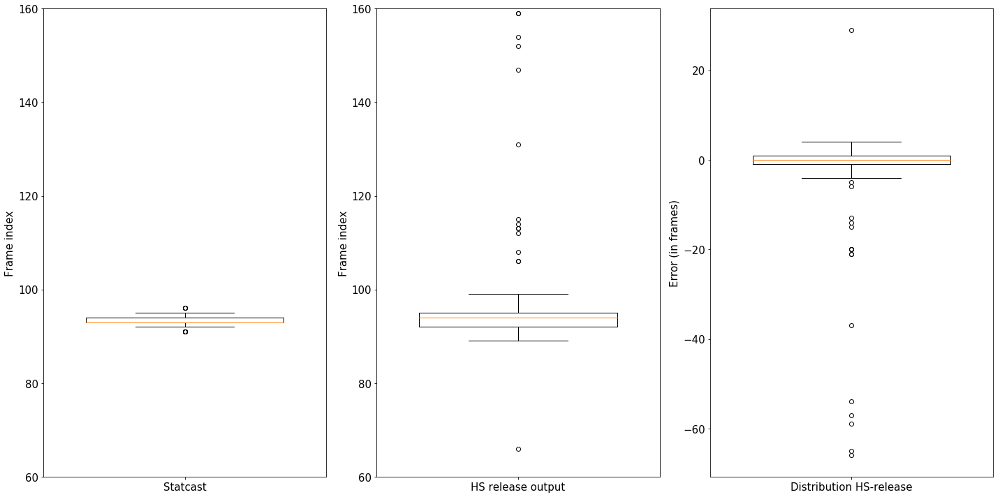

Number of outliers (Error >5) 15
percentage of outliers (Error >5): 11.03%
Deviation 0.0330578512397 Absolute error 1.00826446281 Standard deviation 1.13905766308


In [26]:
deviation = release-higher_shoulders
error = np.absolute(deviation)

plt.figure(figsize = (20,10))
plt.subplot(131)
plt.boxplot(release, positions= [0], widths=(0.7))
plt.xticks([0], ["Statcast"], fontsize=15)
plt.yticks(fontsize=15)
# plt.title("Ground truth labels")
plt.ylabel("Frame index", fontsize=15)
plt.ylim(60,160)
# plt.show()

plt.subplot(132)
plt.boxplot(higher_shoulders, positions= [0], widths=(0.7))
plt.xticks([0], ["HS release output"], fontsize=15)
plt.yticks(fontsize=15)
# plt.title("Error of detected release frame")
plt.ylabel("Frame index", fontsize=15)
plt.ylim(60,160)
# plt.show()

plt.subplot(133)
plt.boxplot(deviation, positions= [0], widths=(0.7))
plt.xticks([0], ["Error distribution"], fontsize=15)
plt.yticks(fontsize=15)
# plt.title("Error of detected release frame")
plt.ylabel("Error (in frames)", fontsize=15)
plt.tight_layout()
plt.show()

inds = np.where(error>10)[0]
print("Number of outliers (Error >5)", len(inds))
print("percentage of outliers (Error >5):", str(round(len(inds)/float(len(error)), 4)*100)+"%")
deviation = np.delete(deviation, inds)
error = np.delete(error, inds)
std = np.std(error)
print("Deviation", np.mean(deviation), "Absolute error", np.mean(error), "Standard deviation", std)